##  Python port of code and figures from the book:


### Bruno Nicenboim, Daniel Schad, and Shravan Vasishth
# An Introduction to Bayesian Data Analysis for Cognitive Science  
####  https://vasishth.github.io/bayescogsci/book/
## Chapter 5.
## @ Jozsef Arato, University of Vienna 
jozsef.arato@unvie.ac.at

## Navigable contents
[5.1: Exchangeability and hierarchical models](#5.1)

[5.2: A hierarchical model with a normal likelihood: The N400 effect](#5.2)

[5.3: A hierarchical log-normal model: The Stroop effect](#5.3)


In [2]:
import numpy as np
import pandas as pd
import pymc as pm
import arviz as az
from matplotlib import pyplot as plt
from scipy import stats
import seaborn as sns


In [7]:
np.set_printoptions(precision=3) 
pd.set_option("display.precision", 3)


## 5.1   Exchangeability and hierarchical models
<a id='5.1'></a>

In [5]:
N_subj = 20
N_obs_subj = 50
N = N_subj * N_obs_subj

in python, it is better to start at zero for row and subj number as well 

In [6]:
df = pd.DataFrame([])
df['row'] = np.arange(N)
df['subj'] = np.repeat(np.arange(N_subj),N_obs_subj)
df

,row,subj
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0
...,...,...
995,995,19
996,996,19
997,997,19
998,998,19


In [5]:
[df['subj'][0],df['subj'][2],df['subj'][51]]

[0, 0, 1]

In [10]:
mu = 100
tau = 15
sigma = 4
mu_i = np.random.normal(mu,tau,N_subj)
df_h = df.copy()
df_h['y'] = np.random.normal(mu_i[df['subj']],sigma,N)

In [9]:
df_h

,row,subj,y
0,0,0,126.738
1,1,0,125.473
2,2,0,127.220
3,3,0,135.956
4,4,0,124.569
...,...,...,...
995,995,19,116.492
996,996,19,112.384
997,997,19,115.489
998,998,19,114.195


In [15]:
with pm.Model() as fit_h:
    sd_intercept = pm.Normal('sd_intercept',10,20) 
    sigma = pm.Normal('sigma',2,5)   
     
    U_i = pm.Normal('U_i',0,sd_intercept,size=N_subj)

    pred = pm.Normal('pred',mu=Intercept+U_i[df['subj']],sigma=sigma,observed=df_h['y'])

    trace_h = pm.sample(tune=1000,target_accept=.95)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sd_intercept, Intercept, sigma, U_i]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 63 seconds.


In [9]:
trace_summary = az.summary(trace_h,hdi_prob=.95)
trace_summary

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,96.213,3.395,89.898,102.691,0.283,0.200,149.0,144.0,1.03
U_i[0],-11.104,3.428,-17.707,-4.820,0.280,0.198,155.0,158.0,1.02
U_i[1],-16.355,3.432,-22.939,-10.194,0.286,0.202,147.0,156.0,1.03
U_i[2],-1.423,3.423,-8.026,4.721,0.285,0.202,148.0,159.0,1.03
U_i[3],-4.526,3.436,-11.141,1.717,0.277,0.196,158.0,154.0,1.02
U_i[4],-26.184,3.424,-33.016,-20.077,0.281,0.199,152.0,155.0,1.03
U_i[5],1.633,3.454,-5.223,7.966,0.282,0.200,155.0,152.0,1.02
U_i[6],31.695,3.448,25.176,37.982,0.279,0.201,158.0,160.0,1.03
U_i[7],7.628,3.438,1.130,14.061,0.283,0.211,152.0,162.0,1.03
U_i[8],9.175,3.435,2.461,15.412,0.286,0.212,148.0,162.0,1.02


#### posterior estimates for means:

In [15]:
trace_summary['mean']['Intercept']+trace_summary['mean'].filter(like='U_i')


U_i[0]      85.109
U_i[1]      79.858
U_i[2]      94.790
U_i[3]      91.687
U_i[4]      70.029
U_i[5]      97.846
U_i[6]     127.908
U_i[7]     103.841
U_i[8]     105.388
U_i[9]     115.948
U_i[10]    101.421
U_i[11]     97.937
U_i[12]     88.623
U_i[13]     88.964
U_i[14]    115.993
U_i[15]     96.477
U_i[16]    103.727
U_i[17]     73.670
U_i[18]     97.142
U_i[19]     90.580
Name: mean, dtype: float64

#### true values

In [16]:
mu_i

array([ 85.909,  79.96 ,  94.314,  92.535,  70.441,  96.758, 127.255,
       104.217, 105.357, 117.309, 101.438,  96.804,  88.266,  88.947,
       116.534,  96.184, 102.604,  74.529,  98.512,  90.037])

### complete pooling model

In [22]:
sigma = 4
mu = 100
df_cp = df.copy()
df_cp['y'] = np.random.normal(mu, sigma,N)
df_cp

,row,subj,y
0,0,0,104.587828
1,1,0,102.721666
2,2,0,99.893810
3,3,0,101.554103
4,4,0,111.740192
...,...,...,...
995,995,19,102.004193
996,996,19,98.557393
997,997,19,101.204728
998,998,19,106.766829


In [23]:
with pm.Model() as fit_cp:
    # priors
    Intercept = pm.Normal('Intercept',50, 200)
    sigma = pm.Normal('sigma',2,5)
    
    # likelihood
    pred = pm.Normal('pred',mu=Intercept,sigma=sigma,observed=df_cp['y'])

    trace_cp = pm.sample(tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Intercept, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 25 seconds.


In [27]:
az.summary(trace_cp,hdi_prob=.95)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,99.905,0.130,99.636,100.147,0.002,0.001,4251.0,2961.0,1.0
sigma,4.100,0.091,3.921,4.277,0.001,0.001,4220.0,3111.0,1.0


### unpooled model

In [18]:


sigma = 4
mu_i = np.array([156, 178, 95, 183, 147, 191, 67, 153, 129, 119, 195,
          150, 172, 97, 110, 115, 78, 126, 175, 80])

df_np = df.copy()
df_np['y'] = np.random.normal(mu_i[df['subj']], sigma,N)
df_np

,row,subj,y
0,0,0,153.397582
1,1,0,156.074825
2,2,0,150.767996
3,3,0,159.572396
4,4,0,160.660105
...,...,...,...
995,995,19,87.536164
996,996,19,79.535980
997,997,19,82.409400
998,998,19,80.632728


In [19]:
with pm.Model() as fit_np:
    # priors
    Intercept = pm.Normal('Intercept',50, 200,shape=N_subj)
    sigma = pm.Normal('sigma',2,5)
   
    # likelihood
    pred = pm.Normal('pred',mu=Intercept[df['subj']],sigma=sigma,observed=df_np['y'])

    trace_np = pm.sample(tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Intercept, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 27 seconds.


In [21]:
az.summary(trace_np,hdi_prob=.95)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept[0],156.024,0.574,154.923,157.121,0.006,0.004,10547.0,3121.0,1.0
Intercept[1],178.316,0.587,177.175,179.466,0.006,0.004,8945.0,2774.0,1.0
Intercept[2],94.813,0.564,93.687,95.920,0.006,0.004,10556.0,3129.0,1.0
Intercept[3],184.032,0.582,182.919,185.126,0.006,0.004,8470.0,2881.0,1.0
Intercept[4],147.449,0.582,146.225,148.538,0.006,0.004,10361.0,3237.0,1.0
Intercept[5],191.028,0.573,189.971,192.195,0.006,0.004,8682.0,3034.0,1.0
Intercept[6],67.226,0.577,66.127,68.315,0.006,0.004,10290.0,3014.0,1.0
Intercept[7],153.540,0.567,152.480,154.704,0.006,0.004,9227.0,2640.0,1.0
Intercept[8],129.430,0.578,128.287,130.563,0.006,0.004,8572.0,2886.0,1.0
Intercept[9],118.527,0.607,117.374,119.705,0.006,0.004,10246.0,2829.0,1.0


## 5.2  A hierarchical model with a normal likelihood: The N400 effect
<a id='5.2'></a>

In [11]:
EEG = pd.read_csv('Data/df_eeg.csv')
EEG['c_cloze'] = EEG['cloze']-np.mean(EEG['cloze'])

In [12]:
EEG.head()

,Unnamed: 0,subj,cloze,item,n400,cloze_ans,N,c_cloze
0,1,1,0.00,1,7.08,0,44,-0.476
1,2,1,0.03,2,-0.68,1,44,-0.446
2,3,1,1.00,3,1.39,44,44,0.524
3,4,1,0.93,4,22.78,41,44,0.454
4,5,1,0.00,5,1.61,0,44,-0.476


#### Figure 5.5

<AxesSubplot: xlabel='n400', ylabel='Count'>

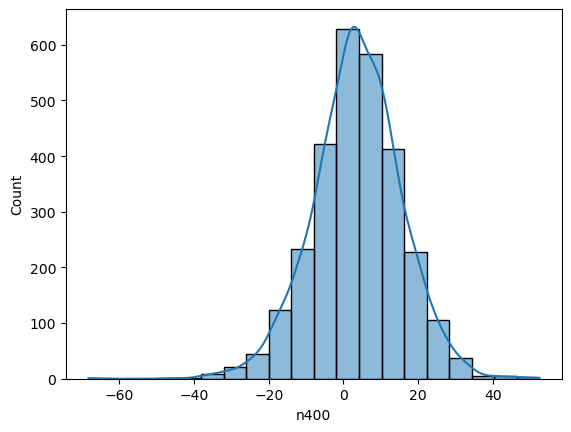

In [32]:
sns.histplot(EEG['n400'],bins=20,kde=True)


### 5.2.1. Complete pooling model

In [13]:
samples = stats.truncnorm.rvs(loc=0, scale=50,a=0,b=1000,size=20000)  # since b is obilgatory, we can give a very high value, so that it doe snot affect the outcome
print('mean',np.mean(samples),'sd',np.std(samples))

mean 39.92865797505828 sd 30.3866407790573


In [18]:
np.quantile(samples,[0.025,.975])

array([  1.62514508, 111.65830409])

In [26]:
with pm.Model() as fit_N400_cp:
    Intercept = pm.Normal('b_Intercept',0,10)

    b1cloze = pm.Normal('b_c_cloze',0,10)
    Err = pm.Normal('sigma',0,50)

    ll = pm.Normal('ll',mu=Intercept+EEG['c_cloze'].to_numpy()*b1cloze,sigma=Err,observed=EEG['n400'].to_numpy())
    trace_N400_cp = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b_Intercept, b_c_cloze, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 24 seconds.


In [28]:
az.summary(trace_N400_cp)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b_Intercept,3.663,0.222,3.252,4.085,0.003,0.002,5759.0,3345.0,1.0
b_c_cloze,2.252,0.556,1.221,3.300,0.007,0.005,6763.0,3232.0,1.0
sigma,11.820,0.154,11.541,12.106,0.002,0.001,5448.0,3112.0,1.0


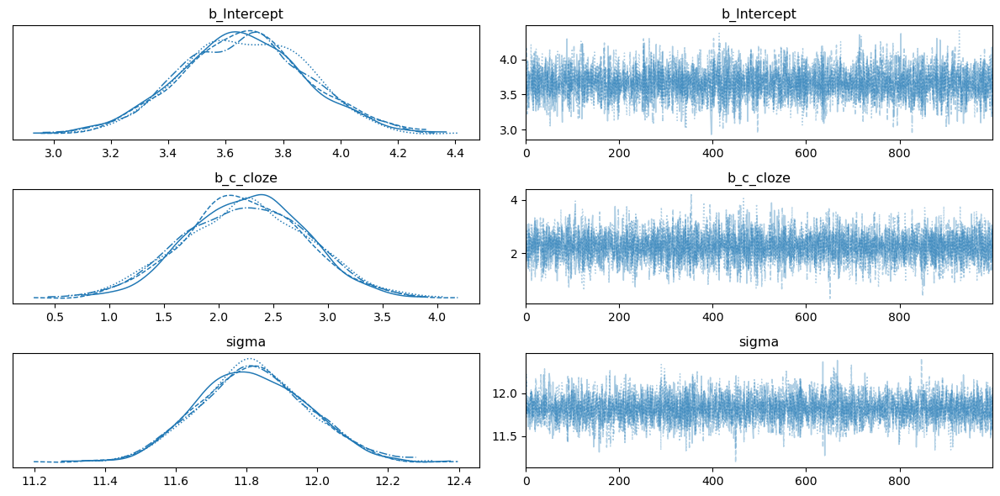

In [29]:
az.plot_trace(trace_N400_cp)
plt.tight_layout()

## 5.2.2 No pooling model 

In [30]:
NS = len(np.unique(EEG['subj']))
SubjIdx = EEG['subj'].to_numpy()-1  # zero based index variable


In [31]:
with pm.Model() as fit_N400_np :
    b1cloze = pm.Normal('b1cloze_ind',0,10,size=NS)
    b0ind = pm.Normal('b0_ind',0,10,size=NS)

    Err = pm.Normal('Err',0,50)
    ll = pm.Normal('ll',mu=b0ind[SubjIdx]+EEG['cloze'].to_numpy()*b1cloze[SubjIdx],sigma=Err,observed=EEG['n400'].to_numpy())
    trace_N400_np = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b1cloze_ind, b0_ind, Err]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 41 seconds.


In [32]:
summary_ind = az.summary(trace_N400_np,hdi_prob=.95)
summary_ind

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b1cloze_ind[0],-1.552,2.971,-7.536,3.935,0.036,0.043,6692.0,2886.0,1.0
b1cloze_ind[1],-2.205,3.245,-8.525,4.000,0.041,0.047,6392.0,2909.0,1.0
b1cloze_ind[2],-0.359,3.215,-6.897,5.618,0.040,0.052,6319.0,2504.0,1.0
b1cloze_ind[3],3.113,3.077,-2.705,9.164,0.036,0.035,7185.0,3310.0,1.0
b1cloze_ind[4],-0.999,3.017,-6.580,5.019,0.035,0.045,7605.0,3243.0,1.0
...,...,...,...,...,...,...,...,...,...
b0_ind[33],6.279,1.919,2.512,9.953,0.022,0.017,7861.0,3455.0,1.0
b0_ind[34],1.053,1.868,-2.475,4.819,0.024,0.025,6221.0,3266.0,1.0
b0_ind[35],-1.104,1.936,-4.856,2.669,0.026,0.025,5689.0,3134.0,1.0
b0_ind[36],2.497,1.921,-0.978,6.679,0.025,0.021,5779.0,3396.0,1.0


In [192]:
betaind = summary_ind['mean'].filter(like='b1cloze')   # get mean of the means
beta_lower = summary_ind['hdi_2.5%'].filter(like='b1cloze')   # get mean of the means
beta_upper = summary_ind['hdi_97.5%'].filter(like='b1cloze')   # get mean of the means


 we just average the trace across participant, and calcualte the HDI of the average to get confidence intervals (credible intervals)


In [96]:
hdi = az.hdi(np.mean(trace_N400_np.posterior.b1cloze,2),hdi_prob=.95) 

 #### Figure 5.7
 the below forest plot is not ordered by the size of the effect, but keeps the original order of the data..
  
 

Text(0.5, 0, 'By-subject effect of cloze probability (mV)')

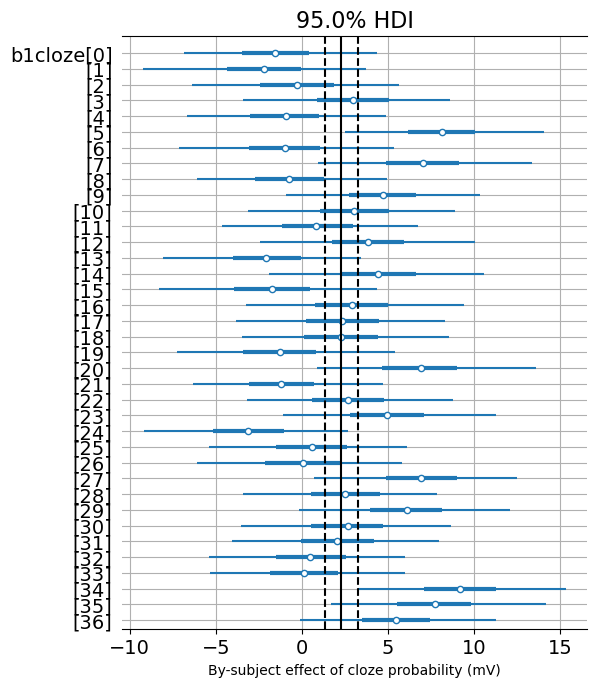

In [99]:
az.plot_forest(trace_N400_np,var_names=['b1cloze'],combined=True,hdi_prob=.95)
plt.axvline(np.mean(betaind),color='k')
plt.axvline(hdi.b1cloze[0],color='k',linestyle='--')
plt.axvline(hdi.b1cloze[1],color='k',linestyle='--')
plt.grid()
plt.xlabel('By-subject effect of cloze probability (mV)')

## 5.2.3 Varying intercepts and varying slopes model  (Mv)


In [37]:
with pm.Model() as fit_N400_v:
    
    # error term:
    sigma = pm.HalfNormal('sigma',50)

   
    # hyperpriors:
    sd_subj_intercept = pm.HalfNormal('sd_subj_Intercept',20) # to observe the shrinkage, we need smaller SD hyperior
    sd_subj_cloze = pm.HalfNormal('sd_subj_c_cloze',20) 
    
    # individual ajustments --"random effects"
    U1 = pm.Normal('U1',0,sd_subj_intercept,size=NS)
    U2 = pm.Normal('U2',0,sd_subj_cloze,size=NS)
    
    # main effect
    beta_cloze = pm.Normal('b_c_cloze',0,10)
    
    # intercept
    intercept = pm.Normal('b_Intercept',0,10)
    
    
      # to save the indivdual effect of the varying slopes (mean effect plus adjustment), we make a new deterministic variable)
    pm.Deterministic('b1cloze_ind',beta_cloze+U2)

    
    Lpred = intercept+U1[SubjIdx]+EEG['c_cloze'].to_numpy()*(beta_cloze+U2[SubjIdx])
    ll = pm.Normal('ll',mu=Lpred,sigma=sigma,observed=EEG['n400'].to_numpy())
    
    trace_N400_v = pm.sample(tune=1000,chains=2) #,target_accept=.95)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [sigma, sd_subj_Intercept, sd_subj_c_cloze, U1, U2, b_c_cloze, b_Intercept]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 43 seconds.


In [38]:
trace_vsummary = az.summary(trace_N400_v,hdi_prob=.95)
trace_vsummary

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
U1[0],1.175,1.127,-1.065,3.362,0.023,0.020,2308.0,1218.0,1.00
U1[1],-0.749,1.230,-3.355,1.592,0.023,0.026,2960.0,1097.0,1.00
U1[2],-0.630,1.175,-3.020,1.602,0.022,0.024,2874.0,1377.0,1.00
U1[3],2.980,1.177,0.623,5.322,0.023,0.018,2668.0,1381.0,1.00
U1[4],-1.687,1.139,-3.905,0.543,0.023,0.018,2373.0,1322.0,1.00
...,...,...,...,...,...,...,...,...,...
b1cloze_ind[32],1.737,1.664,-1.895,4.834,0.039,0.032,1837.0,1169.0,1.00
b1cloze_ind[33],1.600,1.715,-1.799,5.022,0.046,0.034,1522.0,1154.0,1.00
b1cloze_ind[34],4.255,2.112,0.719,8.698,0.110,0.078,359.0,859.0,1.01
b1cloze_ind[35],3.773,1.931,0.072,7.455,0.097,0.068,402.0,908.0,1.01


In [191]:
betaind_v = trace_vsummary['mean'].filter(like='b1cloze_ind')   # get mean of the means
beta_lower_v = trace_vsummary['hdi_2.5%'].filter(like='b1cloze_ind')   # get mean of the means
beta_upper_v = trace_vsummary['hdi_97.5%'].filter(like='b1cloze_ind')   # get mean of the means


In [39]:
hdib_c = az.hdi(trace_N400_v,var_names=['b_c_cloze'])


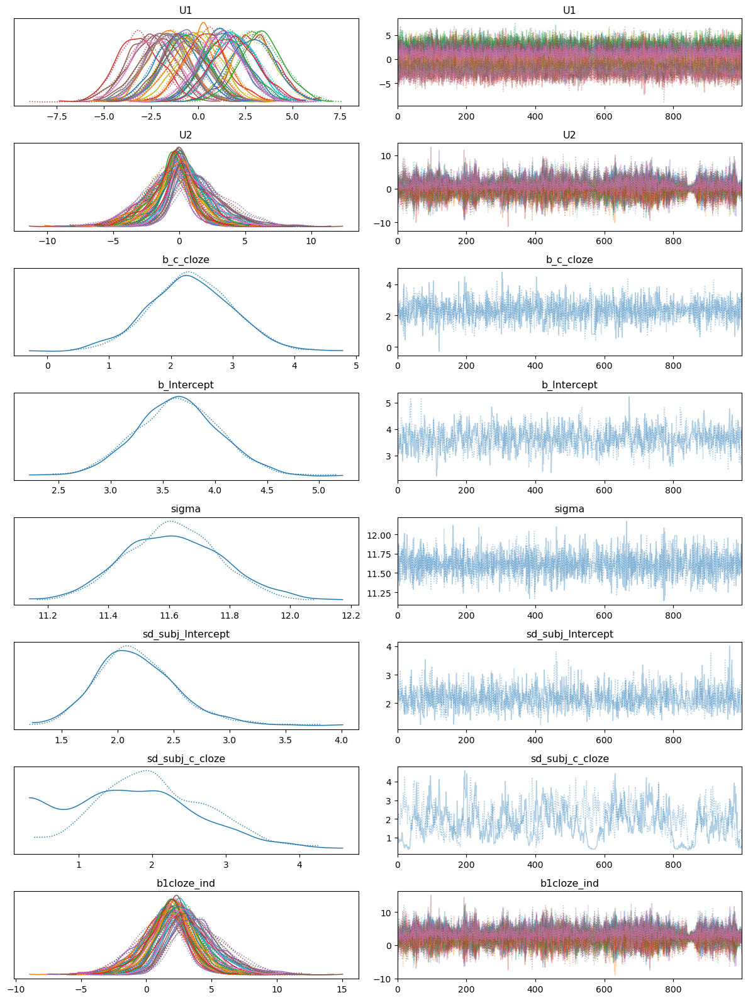

In [40]:
az.plot_trace(trace_N400_v) #var_names=['b_Intercept','b_c_cloze','sd_subj_Intercept','sd_subj_c_cloze']
plt.tight_layout()

array([[<AxesSubplot: title={'center': 'b_Intercept'}>,
        <AxesSubplot: title={'center': 'b_c_cloze'}>,
        <AxesSubplot: title={'center': 'sd_subj_Intercept'}>],
       [<AxesSubplot: title={'center': 'sd_subj_c_cloze'}>,
        <AxesSubplot: title={'center': 'sigma'}>, <AxesSubplot: >]],
      dtype=object)

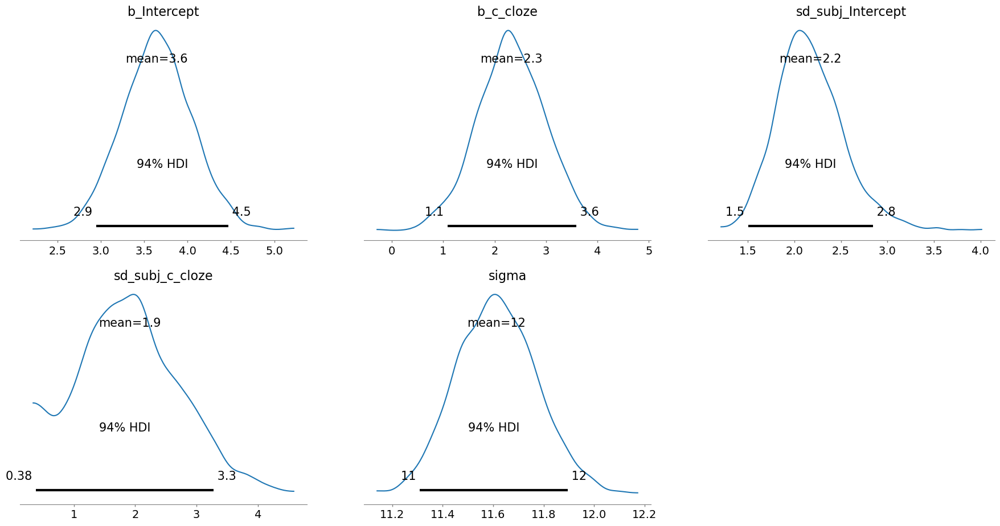

In [41]:
az.plot_posterior(trace_N400_v,var_names=['b_Intercept','b_c_cloze','sd_subj_Intercept','sd_subj_c_cloze','sigma'])

#### Figure 5.9: 95% credible intervals of adjustments to the effect of cloze probability for each subject

(this is easy , but not ordered by the size of the effect as in the book)

array([<AxesSubplot: title={'center': '95.0% HDI'}>], dtype=object)

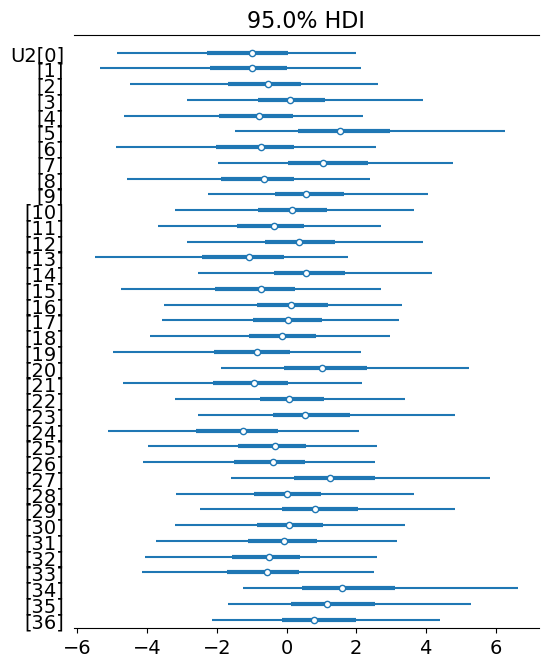

In [42]:

az.plot_forest(trace_N400_v,var_names=['U2'], filter_vars='like',combined=True,hdi_prob=.95)


#### FIGURE 5.10: version 1

for a simple comparison plot for individual effects across models: (variable names have to match between the different models)
 

(no easy way to order participants though)

Text(0, 0.5, 'n400 effect of predictability')

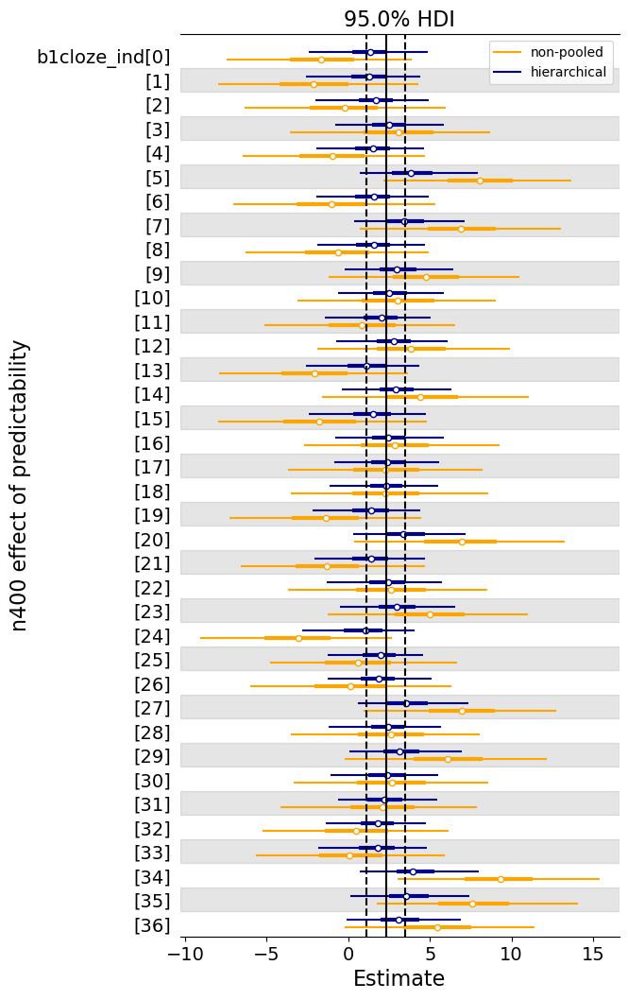

In [326]:
az.plot_forest([ trace_N400_v,trace_N400_np],var_names=['b1cloze_ind'],filter_vars='like',
                           model_names = ["hierarchical","non-pooled"],combined=True,hdi_prob=.95,colors=['darkblue','orange'])

plt.axvline(hdib_c.b_c_cloze[0],color='k',linestyle='--')
plt.axvline(hdib_c.b_c_cloze[1],color='k',linestyle='--')

plt.axvline(trace_vsummary['mean']['b_c_cloze'],color='k')

plt.xlabel('Estimate',fontsize=16)
plt.ylabel('n400 effect of predictability',fontsize=16)


#### FIGURE 5.10: version 2

the above is very easy, but  I did not find a way to order participants,
an alternative is to order "manually" with numpy, and use matplotlib to build a similar figures
we can also use matplotlib to plot the HDI-s

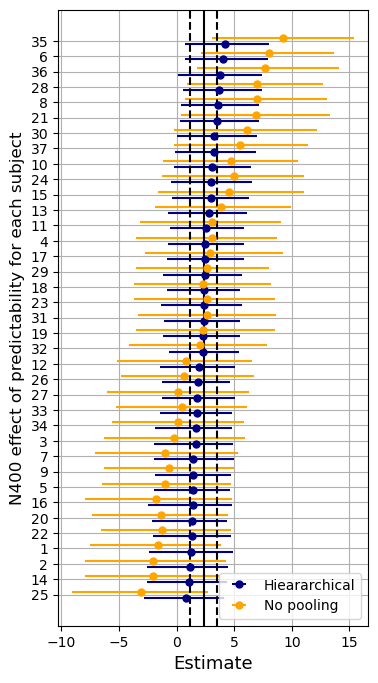

In [325]:
fig,ax = plt.subplots(figsize=(4,8))
y = np.arange(NS)
traces = [trace_N400_v,trace_N400_np] # combined list of to be plotted traces
labels = ['Hieararchical','No pooling']
adjust = [-.2,.2] # adjust positon among the y axis 
cols = ['navy','orange']
for ct,trace_ in enumerate(traces):
    tr_summary = az.summary(trace_,hdi_prob=.95)
    betaind = tr_summary['mean'].filter(like='b1cloze_ind')   # get mean of the means
    beta_lower = tr_summary['hdi_2.5%'].filter(like='b1cloze_ind')   
    beta_upper = tr_summary['hdi_97.5%'].filter(like='b1cloze_ind')  
    if ct==0:  # we want to use the same order for both models
        indexes=np.argsort(betaind)  # get the order of participants by size of the effect
    x = betaind[indexes]
    errl = np.row_stack((x-beta_lower[indexes],np.abs(x-beta_upper[indexes])))
    ax.errorbar(x,y+adjust[ct],xerr=errl,linestyle='none',marker='o',color=cols[ct],label=labels[ct],markersize=5)
ax.grid()
ax.set_xlabel('Estimate',fontsize=13)
ax.set_ylabel('N400 effect of predictability for each subject',fontsize=12)
ax.axvline(hdib_c.b_c_cloze[0],color='k',linestyle='--')
ax.axvline(hdib_c.b_c_cloze[1],color='k',linestyle='--')
ax.axvline(trace_vsummary['mean']['b_c_cloze'],color='k')
ax.set_yticks(np.arange(NS))
ax.set_yticklabels(indexes+1)
ax.legend()

## 5.2.4 Correlated varying intercept varying slopes model (Mh)

#### FIGURE 5.11
Visualization of the LKJ correlation distribution prior with four different values of the  
η parameter


instead of the theoretical curves, an empirical apporach..
I sample the priors with pymc, and fit a KDE plot to the prior predictive samples. 

for eta .9 it looks a bit different, but it is clearly in the right direction, nevertheless the difference between eta=1 and .9  is much less extreme than suggested in the book

(the kde is clearly wrong in this case, as it cannot reproduce a multimodal distr...)

Sampling: [LKJCorr]
Sampling: [LKJCorr]


0 <xarray.DataArray 'R' ()>
array(0)


Sampling: [LKJCorr]


1 <xarray.DataArray 'R' ()>
array(0)


Sampling: [LKJCorr]


2 <xarray.DataArray 'R' ()>
array(0)
3 <xarray.DataArray 'R' ()>
array(0)


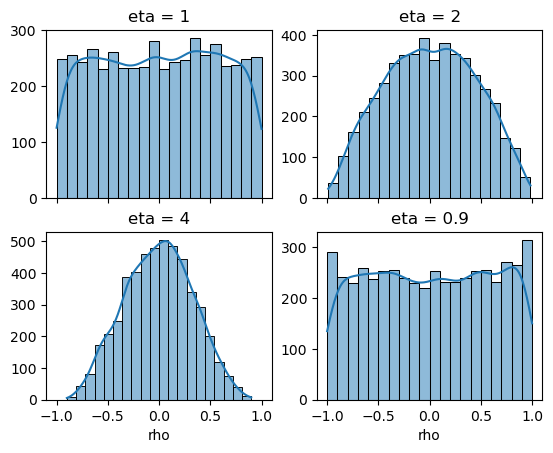

In [307]:
fig,ax = plt.subplots(ncols=2,nrows=2,sharex=True)
ax = ax.flatten()

etas = [1,2,4,.9]
for ce,eta in enumerate(etas):
    with pm.Model() as model:
        R_upper = pm.LKJCorr('LKJCorr', n=2, eta=eta)
        R = pm.expand_packed_triangular(n=2, packed=R_upper, lower=False)
        pm.Deterministic('R',R[0,1])
        prior=pm.sample_prior_predictive(samples=5000)
    print(ce,np.sum(prior.prior.R==0))
    sns.histplot(np.array(prior.prior.R).flatten(),bins=20,ax=ax[ce],kde=True)
    ax[ce].set_ylabel('')
    ax[ce].set_xlabel('rho')
    ax[ce].set_title(f'eta = {eta}')

In [43]:
with pm.Model() as fit_N400_h:
    b1cloze = pm.Normal('b_c_cloze',0,10)
    b0 = pm.Normal('b_Intercept',0,10)
    sigma = pm.Normal('sigma',0,20)

    
    chol_subj, corr, sigmas = pm.LKJCholeskyCov(
        'chol_cov_subj', eta=2.0, n=2, sd_dist=pm.Normal.dist(0,20, size=2))
    
    pm.Deterministic('cor_subj_Intercept_c_cloze',corr[0,1]) # store off diagonal of the correlation matrix
   # pm.Deterministic('sd_subj_int',sigmas[0]) # store SD of intercept across participants
  #  pm.Deterministic('sd_subj_c_cloze',sigmas[1]) # store SD of slope across participants

   
    IndSubjEff = pm.MvNormal('IndSubjEff',mu=0,chol=chol_subj,size=NS)  # multivariate normal individual effects
     ## item specific effect
    
    b0ind = pm.Deterministic('b0ind',IndSubjEff[:,0])  # subject specific intercept
    b1clozeInd = pm.Deterministic('b1clozeInd',IndSubjEff[:,1]) # subject specific slope
    
    
   
    
    meanpred = b0+b0ind[SubjIdx]+EEG['c_cloze'].to_numpy()*(b1cloze+b1clozeInd[SubjIdx])
    ll = pm.Normal('ll',mu=meanpred,sigma=sigma,observed=EEG['n400'].to_numpy())
    trace_N400_h = pm.sample(tune=1000,target_accept=.95,chains=2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [b_c_cloze, b_Intercept, sigma, chol_cov_subj, IndSubjEff]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 96 seconds.


#### FIGURE 5.12: The posteriors of the parameters in the model fit_N400_h

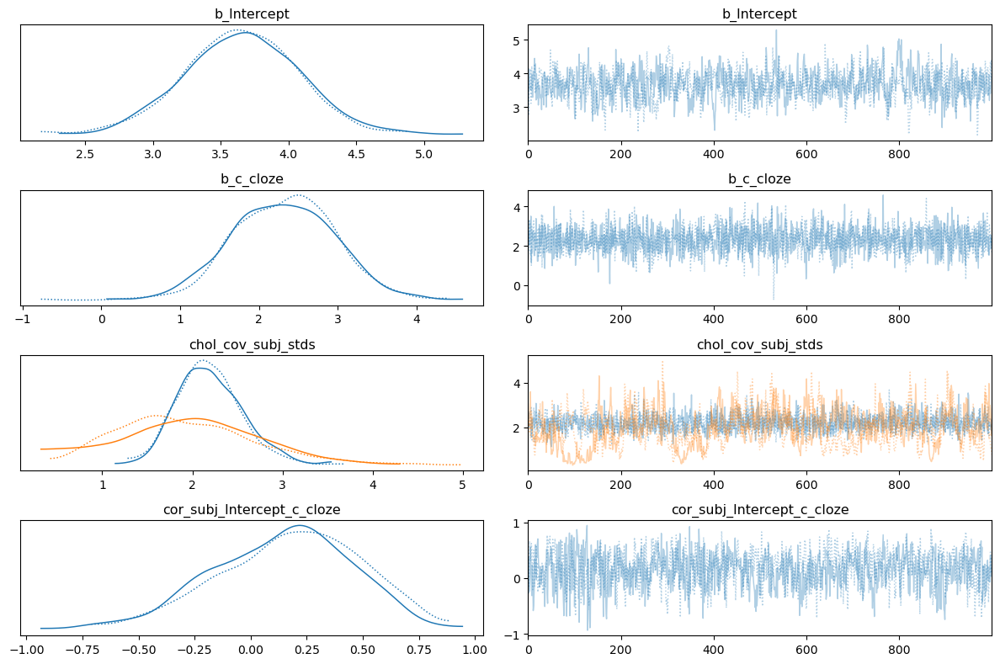

In [44]:

varnames = ['b_Intercept','b_c_cloze','chol_cov_subj_stds','cor_subj_Intercept_c_cloze']
az.plot_trace(trace_N400_h,var_names=varnames)
plt.tight_layout()

###  5.2.5 By-subjects and by-items correlated varying intercept varying slopes model (Msih)


get item number and index variable

In [45]:
ItemIdx = EEG['item'].to_numpy()-1
NI = len(np.unique(EEG['item']))
print(ItemIdx)
print('num items',NI)

[ 0  1  2 ... 68 79 78]
num items 80


In [55]:


prior_coords = {'obs_id': SubjIdx}  # we need this to be able to make individual posterior predicitons later

with pm.Model(coords = prior_coords) as fit_N400_sih:
    b1cloze = pm.Normal('b1cloze',0,10)
    b0 = pm.Normal('b0',0,10)
    sigma = pm.HalfNormal('sigma',50)

   
    chol_subj, corr, sigmas = pm.LKJCholeskyCov(
        'chol_cov_subj', eta=2.0, n=2, sd_dist=pm.Normal.dist(0,20,size=2))
    
    pm.Deterministic('cor_subj_Intercept_c_cloze',corr[0,1]) # store off diagonal of the correlation matrix
    pm.Deterministic('sd_subj_int',sigmas[0]) # store SD of intercept across participants
    pm.Deterministic('sd_subj_c_cloze',sigmas[1]) # store SD of slope across participants

    chol_item, corr2, sigmas2 = pm.LKJCholeskyCov(
        'chol_cov_item', eta=2.0, n=2, sd_dist=pm.Normal.dist(0,20, size=2))
    
    pm.Deterministic('cor_item_Intercept_c_cloze',corr2[0,1])
    pm.Deterministic('sd_item_int',sigmas2[0]) # store SD of intercept across participants
    pm.Deterministic('sd_item_c_cloze',sigmas2[1]) # store SD of slope across participants

   
    IndSubjEff = pm.MvNormal('IndSubjEff',mu=0,chol=chol_subj,size=NS)  # multivariate normal individual effects
     ## item specific effect
    IndItemEff = pm.MvNormal('IndItemEff',mu=0,chol=chol_item,size=NI) # multivariate normal item specific effects

    b0ind = pm.Deterministic('b0ind',IndSubjEff[:,0])  # subject specific intercept
    b1clozeInd = pm.Deterministic('b1clozeInd',IndSubjEff[:,1]) # subject specific slope
    
    b0indItem = pm.Deterministic('b0indItem',IndItemEff[:,0])  # item specific intercept
    b1clozeItem = pm.Deterministic('b1clozeItem',IndItemEff[:,1]) # item specific slope

    
    meanpred = b0+b0ind[SubjIdx]+b0indItem[ItemIdx]+EEG['c_cloze'].to_numpy()*(b1cloze+b1clozeInd[SubjIdx]+b1clozeItem[ItemIdx])
    # likelihood
    ll = pm.Normal('ll',mu=meanpred,sigma=sigma,observed=EEG['n400'].to_numpy(),dims = 'obs_id')
    
    trace_N400_sih = pm.sample(chains=2) #tune=1000,target_accept=.95,

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [b1cloze, b0, sigma, chol_cov_subj, chol_cov_item, IndSubjEff, IndItemEff]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 203 seconds.


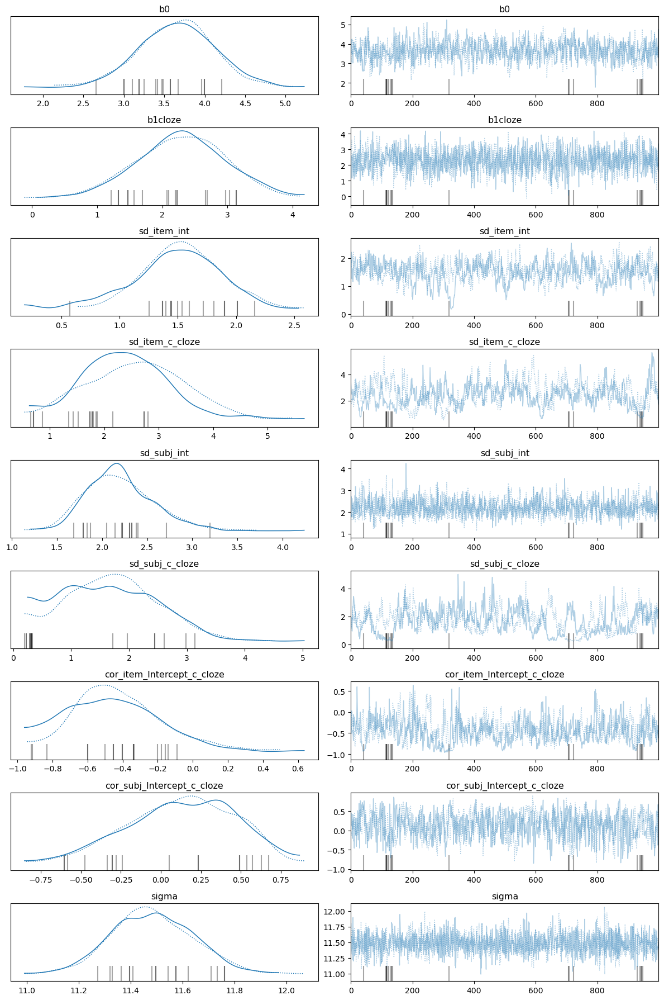

In [56]:

varnames=['b0','b1cloze','sd_item_int','sd_item_c_cloze','sd_subj_int','sd_subj_c_cloze','cor_item_Intercept_c_cloze','cor_subj_Intercept_c_cloze','sigma']
az.plot_trace(trace_N400_sih,var_names=varnames)
plt.tight_layout()

In [17]:
trace_N400_sih

Inference data with groups:
	> posterior
	> sample_stats
	> observed_data

### 5.2.6 Beyond the maximal model–Distributional regression models


In [44]:
with  fit_N400_sih:
    pm.sample_posterior_predictive(trace=trace_N400_sih, extend_inferencedata=True)


Sampling: [ll]


#### FIGURE 5.14: Overlay of densities from the posterior predictive distributions of the model fit_N400_sih.

<AxesSubplot: xlabel='ll / ll'>

C:\Users\aratoj87\Anaconda3\envs\pymc_env\Lib\site-packages\IPython\core\events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
C:\Users\aratoj87\Anaconda3\envs\pymc_env\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


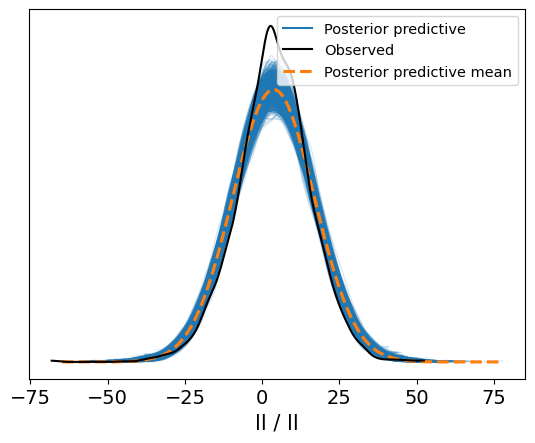

In [20]:
az.plot_ppc(trace_N400_sih,num_pp_samples=200)

####  FIGURE 5.15: The plot shows 100 predicted distributions and the distribution of the average signal data with the density plots for the 37 subjects that participated in the experiment.

note that subject number is here just the index (zero based)

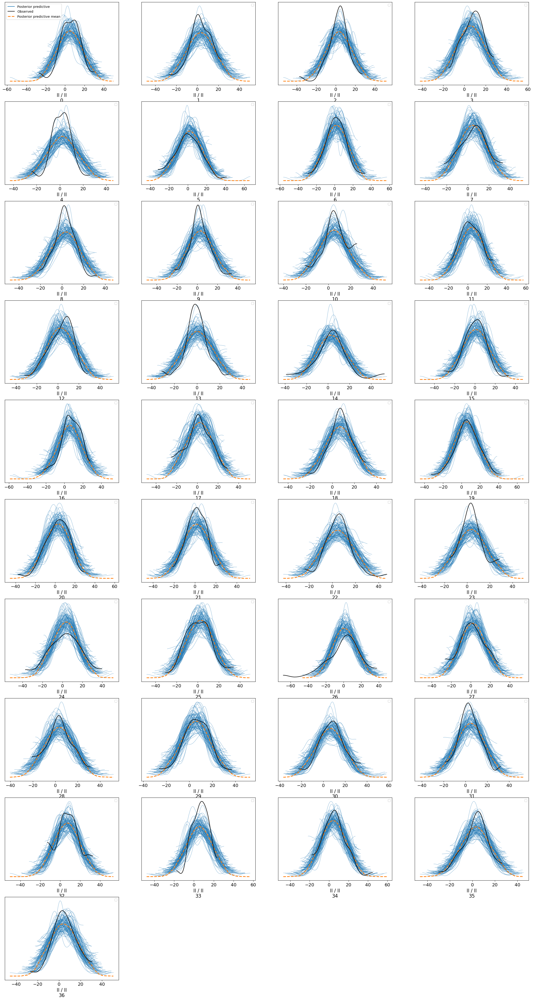

In [21]:
x = az.plot_ppc(trace_N400_sih,flatten=[],coords={'obs_id':np.unique(SubjIdx)},num_pp_samples=100,alpha=.6)

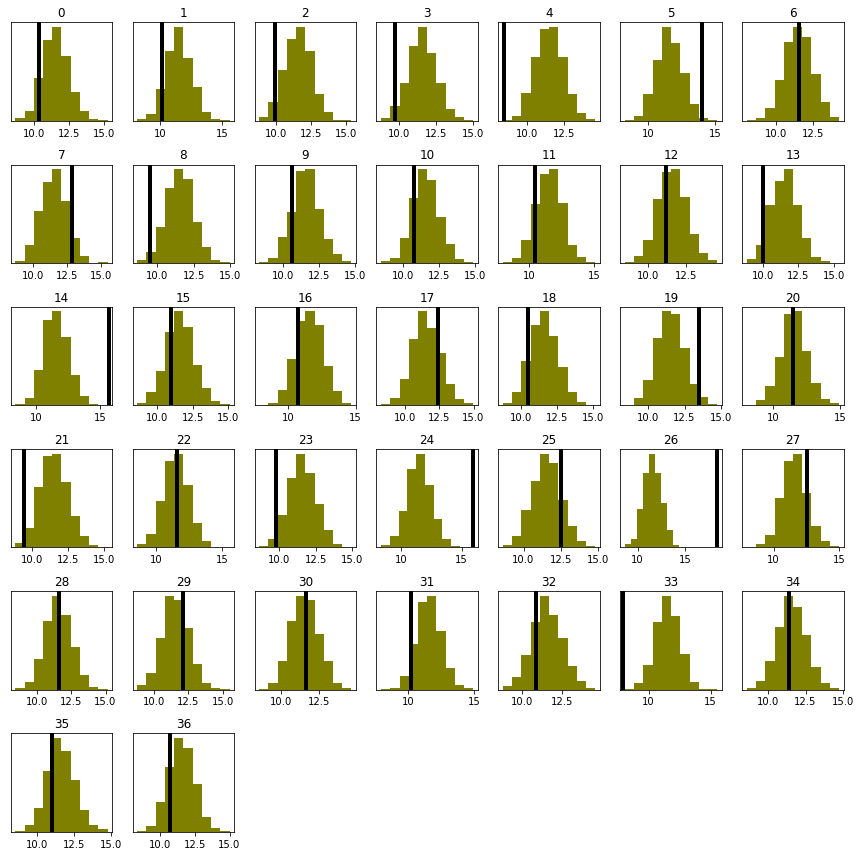

In [57]:
fig,ax = plt.subplots(nrows=6,ncols=7,figsize=(12,12))


ax = ax.flatten()
for cs in range(len(ax)):
    if cs<NS:
        subjdat = np.array(trace_N400_sih.posterior_predictive.ll[:,:,SubjIdx==cs])
        ax[cs].hist(np.std(subjdat,2).flatten(),color='olive')
        ax[cs].axvline(np.std(EEG['n400'][SubjIdx==cs]),color='k',linewidth=4)
        ax[cs].set_title(cs)
    else:
        ax[cs].set_xticks([])
        ax[cs].spines[['top','right','bottom','left']].set_visible(False)
    ax[cs].set_yticks([])
plt.tight_layout()

In [46]:


prior_coords = {'obs_id': SubjIdx}  # we need this to be able to make individual posterior predicitons later

with pm.Model(coords = prior_coords) as fit_N400_s:
    b1cloze = pm.Normal('b1cloze',0,10)
    b0 = pm.Normal('b0',0,10)
    sigma = pm.Normal('sigma',0,pm.math.log(50))

   
    chol_subj, corr, sigmas = pm.LKJCholeskyCov(
        'chol_cov_subj', eta=4.0, n=2, sd_dist=pm.Normal.dist(0,1,size=2))
    
    pm.Deterministic('cor_subj_Intercept_c_cloze',corr[0,1]) # store off diagonal of the correlation matrix
    pm.Deterministic('sd_subj_int',sigmas[0]) # store SD of intercept across participants
    pm.Deterministic('sd_subj_c_cloze',sigmas[1]) # store SD of slope across participants

    chol_item, corr2, sigmas2 = pm.LKJCholeskyCov(
        'chol_cov_item', eta=4.0, n=2, sd_dist=pm.Normal.dist(0,1, size=2))
    
    pm.Deterministic('cor_item_Intercept_c_cloze',corr2[0,1])
    pm.Deterministic('sd_item_int',sigmas2[0]) # store SD of intercept across participants
    pm.Deterministic('sd_item_c_cloze',sigmas2[1]) # store SD of slope across participants

    tau = pm.HalfNormal('tau',5)
    sigmaInd = pm.Normal('sigmaInd',0,tau,size=NS)

    
    IndSubjEff = pm.MvNormal('IndSubjEff',mu=0,chol=chol_subj,size=NS)  # multivariate normal individual effects
     ## item specific effect
    IndItemEff = pm.MvNormal('IndItemEff',mu=0,chol=chol_item,size=NI) # multivariate normal item specific effects

    b0ind = pm.Deterministic('b0ind',IndSubjEff[:,0])  # subject specific intercept
    b1clozeInd = pm.Deterministic('b1clozeInd',IndSubjEff[:,1]) # subject specific slope
    
    b0indItem = pm.Deterministic('b0indItem',IndItemEff[:,0])  # item specific intercept
    b1clozeItem = pm.Deterministic('b1clozeItem',IndItemEff[:,1]) # item specific slope

    
    meanpred = b0+b0ind[SubjIdx]+b0indItem[ItemIdx]+EEG['c_cloze'].to_numpy()*(b1cloze+b1clozeInd[SubjIdx]+b1clozeItem[ItemIdx])
    ll = pm.Normal('ll',mu=meanpred,sigma=pm.math.exp(sigma+sigmaInd[SubjIdx]),observed=EEG['n400'].to_numpy(),dims = 'obs_id')
    trace_N400_s=pm.sample(tune=1000,target_accept=.95,chains=2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [b1cloze, b0, sigma, chol_cov_subj, chol_cov_item, tau, sigmaInd, IndSubjEff, IndItemEff]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 638 seconds.


In [47]:
with  fit_N400_s:
    pm.sample_posterior_predictive(trace=trace_N400_s, extend_inferencedata=True)


Sampling: [ll]


#### FIGURE 5.17   
The green density plots show 100 predicted distributions from a model that includes a hierarchical structure for  
σ. The black density plots show the distribution of the average signal data for the 37 subjects in the experiment.

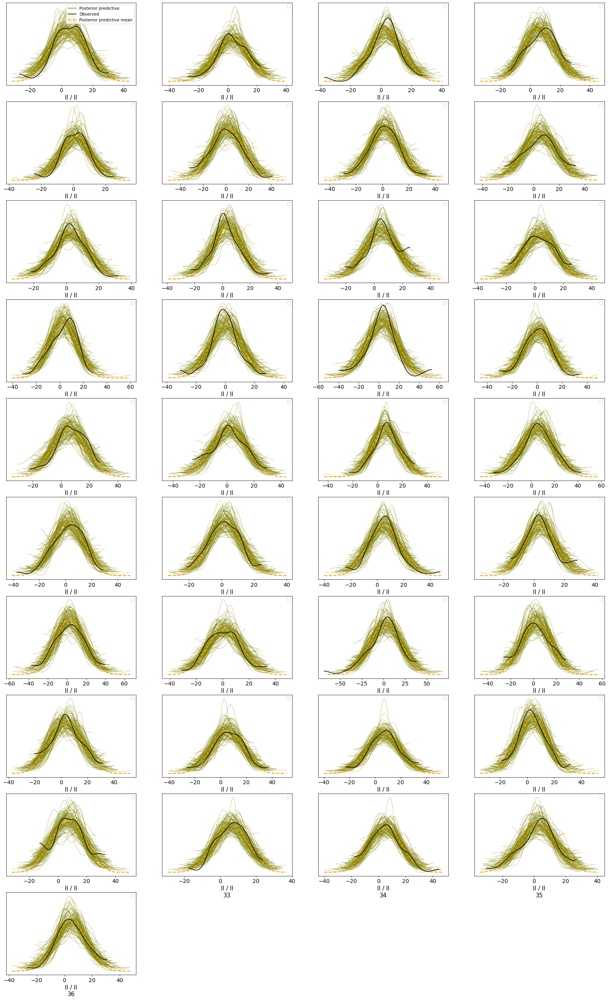

In [48]:
x=az.plot_ppc(trace_N400_s,flatten=[],coords={'obs_id':np.unique(SubjIdx)},num_pp_samples=100,alpha=.6, colors=['olive', 'k', 'orange'])


#### FIGURE 5.18: 
The green histrograms show the distributions of posterior predicted standard deviations from a model that includes a hierarchical structure for  
σ
 , and observed mean standard deviations by subject (black vertical lines).

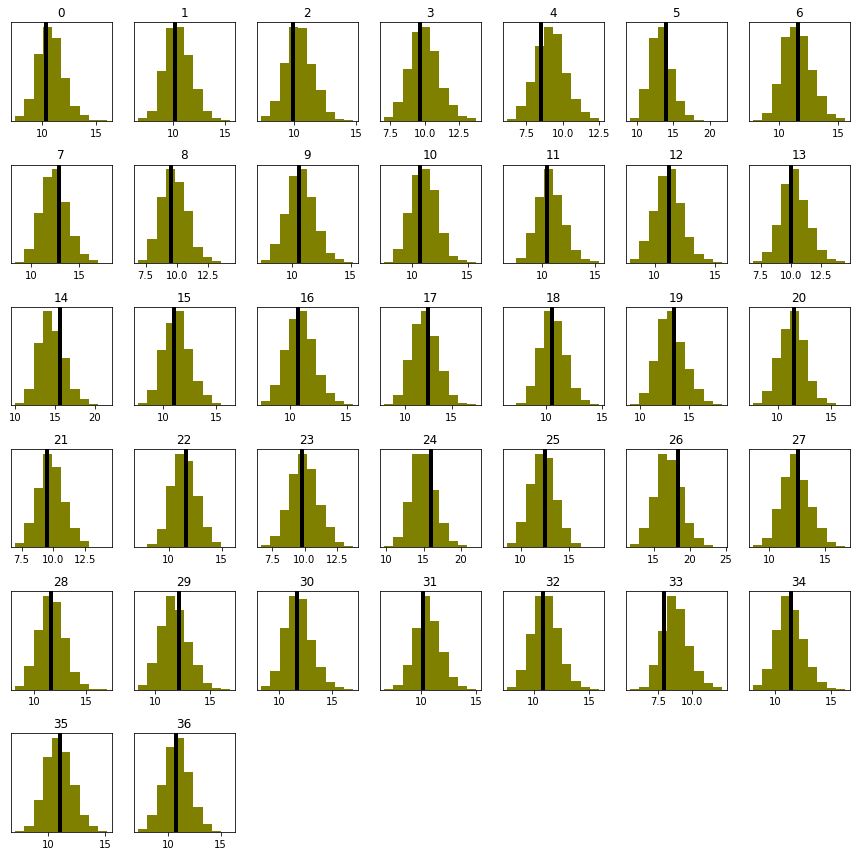

In [55]:
fig,ax = plt.subplots(nrows=6,ncols=7,figsize=(12,12))
ax = ax.flatten()
for cs in range(len(ax)):
    if cs<NS:
        subjdat=np.array(trace_N400_s.posterior_predictive.ll[:,:,SubjIdx==cs])
        ax[cs].hist(np.std(subjdat,2).flatten(),color='olive')
        ax[cs].axvline(np.std(EEG['n400'][SubjIdx==cs]),color='k',linewidth=4)
        ax[cs].set_title(cs)
    else:
        ax[cs].set_xticks([])
        ax[cs].spines[['top','right','bottom','left']].set_visible(False)
    ax[cs].set_yticks([])


plt.tight_layout()

## 5.3 A hierarchical log-normal model: The Stroop effect
<a id='5.3'></a>


In [3]:
Stroop = pd.read_csv('Data/df_stroop.csv')
Stroop

,Unnamed: 0,subj,trial,condition,RT
0,1,1,0,Congruent,1484
1,2,1,1,Incongruent,1316
2,3,1,2,Incongruent,628
3,4,1,3,Congruent,511
4,5,1,4,Congruent,509
...,...,...,...,...,...
3053,3054,50,58,Congruent,386
3054,3055,50,59,Incongruent,376
3055,3056,50,60,Congruent,472
3056,3057,50,61,Congruent,471


In [5]:
SubjIdx = Stroop['subj']-1
NS = len(np.unique(Stroop['subj']))
print(NS)
Stroop['SubjIdx'] = SubjIdx

50


In [8]:
Stroop['c_cond'] = 1
Stroop.loc[Stroop['condition']=='Congruent','c_cond']=-1
Stroop[['condition','c_cond']]

,condition,c_cond
0,Congruent,-1
1,Incongruent,1
2,Incongruent,1
3,Congruent,-1
4,Congruent,-1
...,...,...
3053,Congruent,-1
3054,Incongruent,1
3055,Congruent,-1
3056,Congruent,-1


In [11]:
 
with pm.Model() as Mod_stroop:
    alpha = pm.Normal('alpha',6,1.5)
    beta = pm.Normal('b_c_cond',0,.1)
    sigma = pm.HalfNormal('sigma',1)

    chol_subj, corr, sigmas = pm.LKJCholeskyCov(
        'chol_cov_subj', eta=2.0, n=2, sd_dist=pm.Normal.dist(0,2, size=2))
    
    CorrSubj = pm.Deterministic('CorrSubj',corr[0,1]) # store off diagonal of the correlation matrix
    
    IndSubjEff = pm.MvNormal('IndSubjEff',mu=0,chol=chol_subj,size=NS)  # multivariate normal individual effects
    
    U1 = IndSubjEff[:,0]     # random intercepts

    U2 = IndSubjEff[:,1]     # random slopes

    mean=alpha+U1[SubjIdx]+Stroop['c_cond'].to_numpy()*(beta+U2[SubjIdx])
    obs=pm.LogNormal('obs',mu=mean,sigma=sigma,observed=Stroop['RT'].to_numpy())
    trace_fit_stroop=pm.sample(tune=1000,idata_kwargs={'log_likelihood': True},chains=2,target_accept=.95)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [alpha, b_c_cond, sigma, chol_cov_subj, IndSubjEff]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 111 seconds.


In [35]:
az.summary(trace_fit_stroop,var_names=['b_c_cond'],hdi_prob=.95)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b_c_cond,0.037,0.006,0.025,0.048,0.0,0.0,1497.0,1557.0,1.01


In [14]:
with Mod_stroop:
    pm.sample_posterior_predictive(trace=trace_fit_stroop,extend_inferencedata=True)

Sampling: [obs]


In [30]:
N = np.shape(trace_fit_stroop.posterior_predictive.obs)[1]
print(N)
priorp = np.random.normal(0,.01,N)

1000


#### FIGURE 5.19: The discrepancy between the prior and the posterior distributions for the slope parameter in the model fit_stroop

Text(0.5, 0, 'sample')

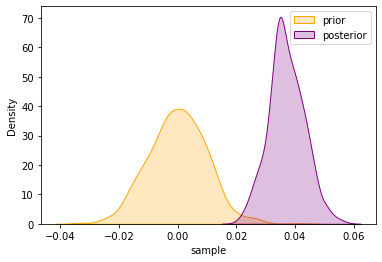

In [32]:
sns.kdeplot(priorp,label='prior',fill=True,color='orange')
sns.kdeplot(trace_fit_stroop.posterior.b_c_cond[1],label='posterior',fill=True,color='purple')
plt.legend()
plt.xlabel('sample')

#### 5.3.1.1 Sensitivity analysis


In [14]:
def MyModStroop(priorsd):
    with pm.Model() as Mod:
        alpha = pm.Normal('alpha',6,1.5)
        beta = pm.Normal('b_c_cond',0,priorsd)
        sigma = pm.HalfNormal('sigma',1)

        chol_subj, corr, sigmas = pm.LKJCholeskyCov(
            'chol_cov_subj', eta=2.0, n=2, sd_dist=pm.Normal.dist(0,2, size=2))

        CorrSubj = pm.Deterministic('CorrSubj',corr[0,1]) # store off diagonal of the correlation matrix

        IndSubjEff = pm.MvNormal('IndSubjEff',mu=0,chol=chol_subj,size=NS)  # multivariate normal individual effects


        U1 = IndSubjEff[:,0]     # random intercepts

        U2 = IndSubjEff[:,1]     # random slopes

        mean = alpha+U1[SubjIdx]+Stroop['c_cond'].to_numpy()*(beta+U2[SubjIdx])
        obs = pm.LogNormal('obs',mu=mean,sigma=sigma,observed=Stroop['RT'].to_numpy())
        trace = pm.sample(tune=500,idata_kwargs={'log_likelihood': True},chains=2,target_accept=.95)

    return trace,Mod

In [55]:
priorsds = [.001,.01,.05,.1,1,2]
tracesums = []
for p in priorsds:
    print(f'prior for b_c_cond: Normal (0,{p})')
    trace,Mod = MyModStroop(p)
    tracesums.append(az.summary(trace,var_names=['alpha','b_c_cond'],hdi_prob=.95))

prior for b_c_cond: Normal (0,0.001)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [alpha, b_c_cond, sigma, chol_cov_subj, IndSubjEff]


Sampling 2 chains for 500 tune and 1_000 draw iterations (1_000 + 2_000 draws total) took 117 seconds.


prior for b_c_cond: Normal (0,0.01)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [alpha, b_c_cond, sigma, chol_cov_subj, IndSubjEff]


Sampling 2 chains for 500 tune and 1_000 draw iterations (1_000 + 2_000 draws total) took 133 seconds.


prior for b_c_cond: Normal (0,0.05)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [alpha, b_c_cond, sigma, chol_cov_subj, IndSubjEff]


Sampling 2 chains for 500 tune and 1_000 draw iterations (1_000 + 2_000 draws total) took 90 seconds.


prior for b_c_cond: Normal (0,0.1)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [alpha, b_c_cond, sigma, chol_cov_subj, IndSubjEff]


Sampling 2 chains for 500 tune and 1_000 draw iterations (1_000 + 2_000 draws total) took 189 seconds.


prior for b_c_cond: Normal (0,1)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [alpha, b_c_cond, sigma, chol_cov_subj, IndSubjEff]


Sampling 2 chains for 500 tune and 1_000 draw iterations (1_000 + 2_000 draws total) took 176 seconds.


prior for b_c_cond: Normal (0,2)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [alpha, b_c_cond, sigma, chol_cov_subj, IndSubjEff]


Sampling 2 chains for 500 tune and 1_000 draw iterations (1_000 + 2_000 draws total) took 158 seconds.


In [85]:
PosteriorBeta_c = pd.DataFrame(np.zeros((len(priorsds),3)),columns=['mean','Q2.5','Q97.5'])
Predictedms = pd.DataFrame(np.zeros((len(priorsds),3)),columns=['mean','Q2.5','Q97.5'])

c = 0

for p,traces in zip(priorsds,tracesums):  

    PosteriorBeta_c.loc[c,'mean'] = traces['mean'][1]
    PosteriorBeta_c.loc[c,'Q2.5'] = traces['hdi_2.5%'][1]
    PosteriorBeta_c.loc[c,'Q97.5'] = traces['hdi_97.5%'][1]
    
    rtdiff=np.exp(traces['mean'][0]+traces['mean'][1])-np.exp(traces['mean'][0]-traces['mean'][1])
    rtdiffq25=np.exp(traces['hdi_2.5%'][0]+traces['hdi_2.5%'][1])-np.exp(traces['hdi_2.5%'][0]-traces['hdi_2.5%'][1])
    rtdiffq975=np.exp(traces['hdi_97.5%'][0]+traces['hdi_97.5%'][1])-np.exp(traces['hdi_97.5%'][0]-traces['hdi_97.5%'][1])
    Predictedms.loc[c,'mean'] = rtdiff
    Predictedms.loc[c,'Q2.5'] = rtdiffq25
    Predictedms.loc[c,'Q97.5'] = rtdiffq975
    
  
    c+=1


#### table 5.1: The summary (mean and 95% credible interval) for the posterior distribution of the slope in the model fit_stroop, given different priors on the slope parameter.

In [86]:
PosteriorBeta_c

,mean,Q2.5,Q97.5
0,0.001,-0.001,0.002
1,0.027,0.015,0.038
2,0.037,0.026,0.049
3,0.038,0.026,0.050
4,0.038,0.026,0.050
5,0.038,0.026,0.051


#### table 5.2:  A summary, under a range of priors, of the posterior distributions of the mean difference between the two conditions, back-transformed to the millisecond scale.

In [87]:
Predictedms

,mean,Q2.5,Q97.5
0,1.100090,-1.052736,2.294557
1,30.154985,16.256285,44.045303
2,41.535063,28.236094,56.861150
3,42.615529,28.236094,58.022539
4,42.658166,28.264345,58.138700
5,42.615529,28.123376,58.947723
